<a href="https://colab.research.google.com/github/abyaadrafid/BHGD/blob/master/BHGD_Vowel_Dia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [2]:
rm ~/.kaggle

rm: cannot remove '/root/.kaggle': No such file or directory


In [0]:
!mkdir ~/.kaggle

In [0]:
!cp /content/gdrive/My\ Drive/kaggle.json /root/.kaggle

In [5]:
!kaggle datasets download -d pestipeti/bengaliai

100% 1.90G/1.91G [00:29<00:00, 66.5MB/s]
100% 1.91G/1.91G [00:30<00:00, 67.1MB/s]


In [6]:
!unzip /content/bengaliai.zip -d /content/images

Archive:  /content/bengaliai.zip
  inflating: /content/images/256_train/256/Train_0.png  
  inflating: /content/images/256_train/256/Train_1.png  
  inflating: /content/images/256_train/256/Train_10.png  
  inflating: /content/images/256_train/256/Train_100.png  
  inflating: /content/images/256_train/256/Train_1000.png  
  inflating: /content/images/256_train/256/Train_10000.png  
  inflating: /content/images/256_train/256/Train_100000.png  
  inflating: /content/images/256_train/256/Train_100001.png  
  inflating: /content/images/256_train/256/Train_100002.png  
  inflating: /content/images/256_train/256/Train_100003.png  
  inflating: /content/images/256_train/256/Train_100004.png  
  inflating: /content/images/256_train/256/Train_100005.png  
  inflating: /content/images/256_train/256/Train_100006.png  
  inflating: /content/images/256_train/256/Train_100007.png  
  inflating: /content/images/256_train/256/Train_100008.png  
  inflating: /content/images/256_train/256/Train_100009.p

In [0]:
import pandas as pd
from fastai.vision import *
df = pd.read_csv('/content/gdrive/My Drive/kaggle/train.csv')

In [0]:
df['labels']= df['vowel_diacritic']
df = df.filter(['image_id','labels'])

In [0]:
tfms = []
il= ImageList.from_df(df=df,path = '/content/images/256_train/256',suffix='.png')
sd = il.split_by_rand_pct(0.1)

In [12]:
sd

ItemLists;

Train: ImageList (180756 items)
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /content/images/256_train/256;

Valid: ImageList (20084 items)
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /content/images/256_train/256;

Test: None

In [0]:
ll = sd.label_from_df()

In [0]:
databunch32 = ll.transform(tfms,size=32).databunch(bs=256)

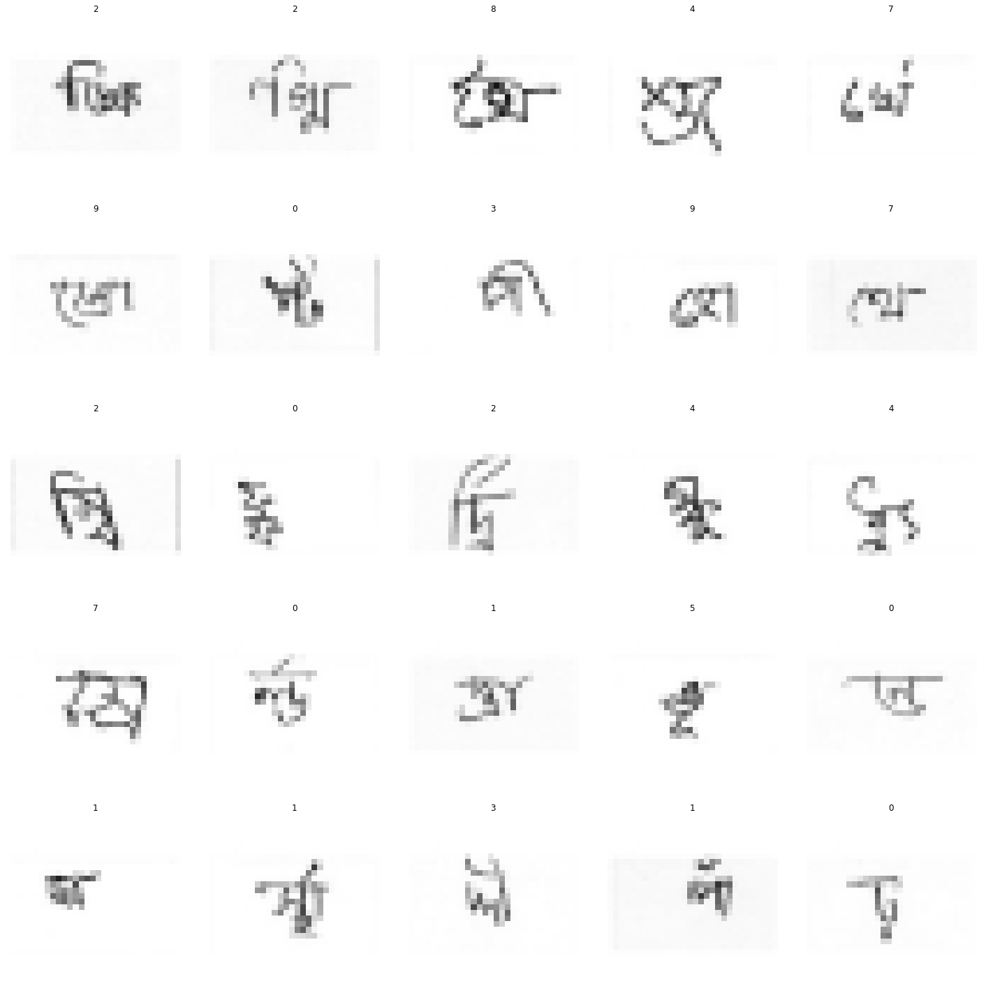

In [15]:
databunch32.show_batch()

In [0]:
recall = Recall(average='macro')
learner32 = cnn_learner(databunch32,models.resnet18,metrics=[recall,accuracy],pretrained=False).mixup()

In [0]:
learner32.unfreeze()

In [26]:
learner32.lr_find()

epoch,train_loss,valid_loss,recall,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


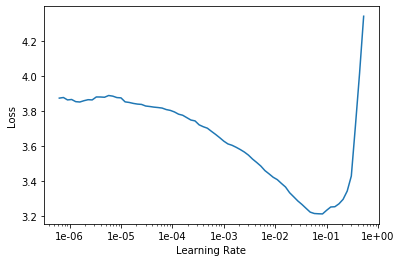

In [27]:
learner32.recorder.plot()

In [28]:
learner32.fit_one_cycle(4,slice(5e-3))

epoch,train_loss,valid_loss,recall,accuracy,time
0,1.302558,1.121136,0.447113,0.618901,05:35
1,1.071915,1.165589,0.549785,0.554720,05:18
2,0.951111,0.554675,0.790989,0.819359,05:14
3,0.889511,0.420577,0.815058,0.862627,05:09


In [0]:
learner32.data = ll.transform(tfms,size=96).databunch(bs=256)

In [0]:
learner32.unfreeze()

epoch,train_loss,valid_loss,recall,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


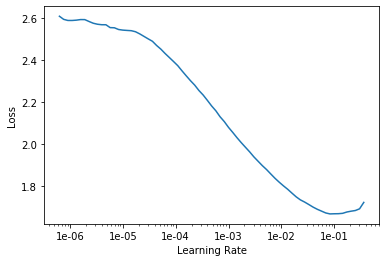

In [31]:
learner32.lr_find()
learner32.recorder.plot()

In [32]:
learner32.fit_one_cycle(4,slice(1e-3,1e-2))

epoch,train_loss,valid_loss,recall,accuracy,time
0,0.811966,0.642719,0.701503,0.805318,10:17
1,0.701786,1.276421,0.481002,0.469130,09:58
2,0.613702,0.322690,0.917646,0.944533,10:13
3,0.566823,0.125872,0.955007,0.965843,10:26


In [0]:
learner32.data = ll.transform(tfms,size=256).databunch(bs=256)

In [0]:
learner32.unfreeze()

epoch,train_loss,valid_loss,recall,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


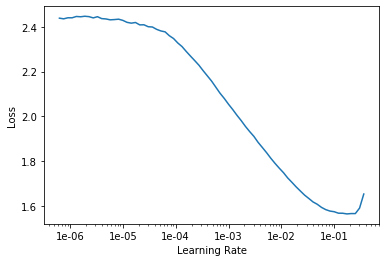

In [35]:
learner32.lr_find()
learner32.recorder.plot()

In [0]:
learner32.fit_one_cycle(6,slice(1e-3,1e-2))

epoch,train_loss,valid_loss,recall,accuracy,time
0,0.648346,1.451173,0.668710,0.535401,11:19
1,0.616586,1.904923,0.319171,0.392551,11:17


In [0]:
learner32.data = ll.transform(tfms,size=192).databunch(bs=256)

In [0]:
learner32.unfreeze()

epoch,train_loss,valid_loss,recall,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


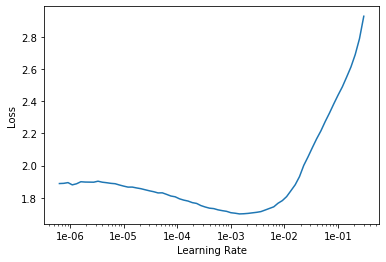

In [0]:
learner32.lr_find()
learner32.recorder.plot()

In [0]:
learner32.fit_one_cycle(4,slice(1e-5,2e-4))

epoch,train_loss,valid_loss,recall,accuracy,time
0,1.416600,0.316140,0.900411,0.915754,10:52


59 misclassified samples over 20084 samples in the validation set.


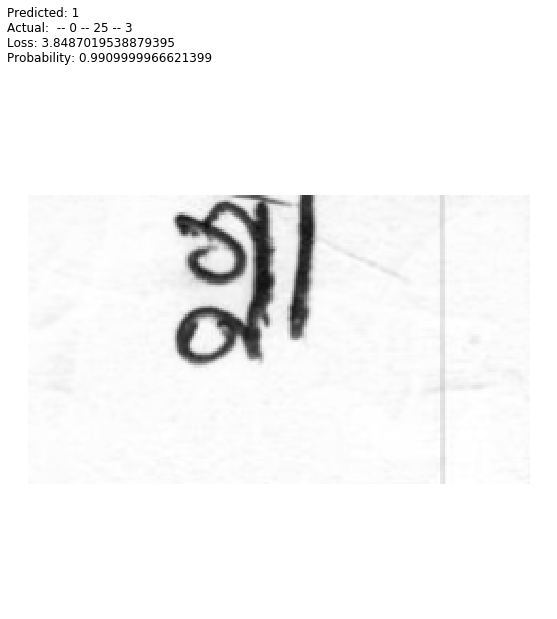

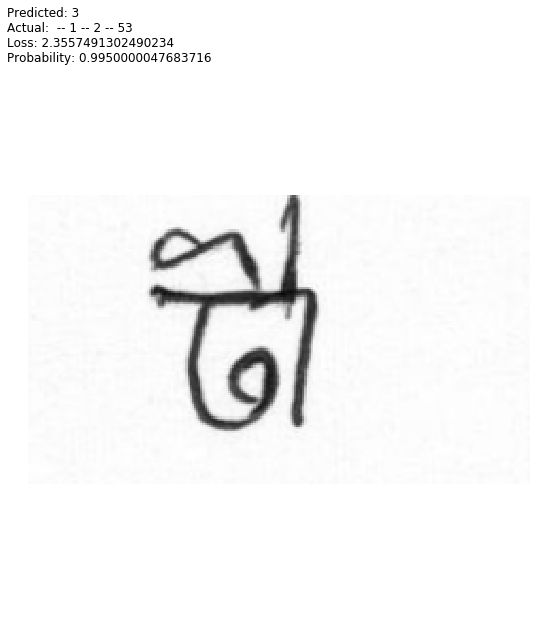

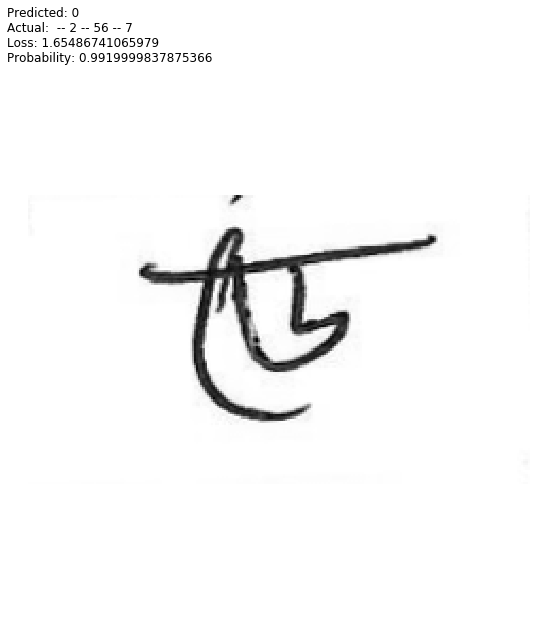

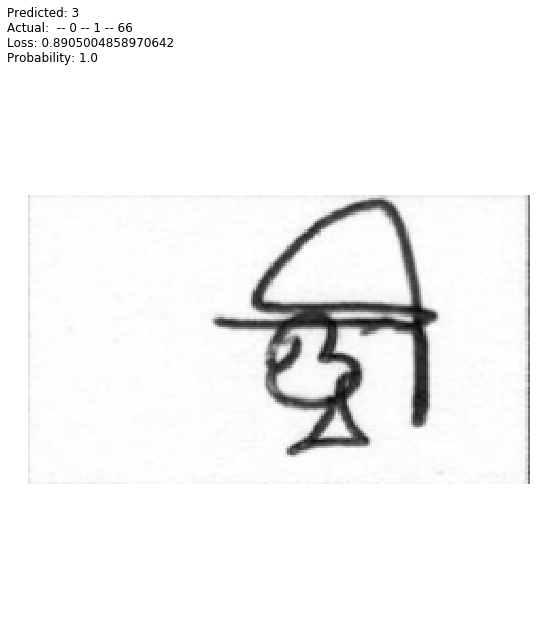

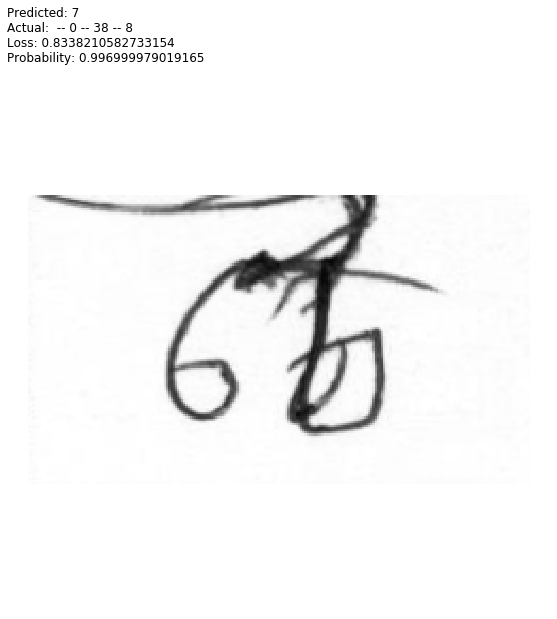

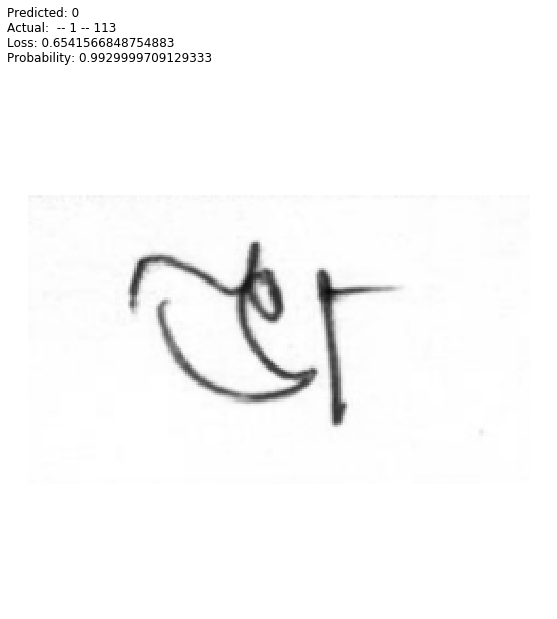

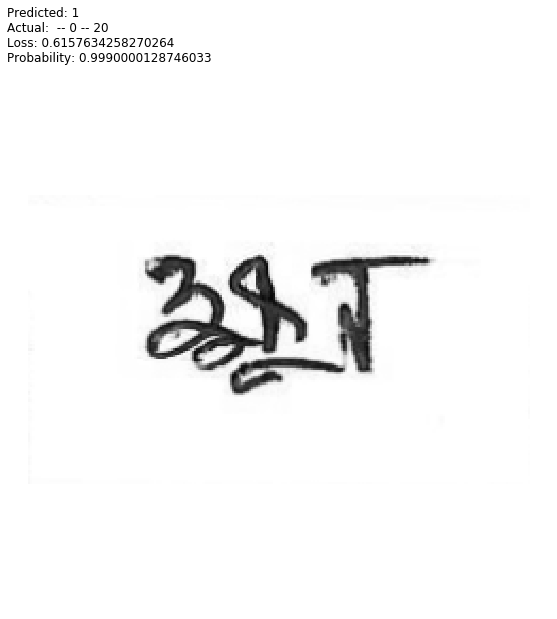

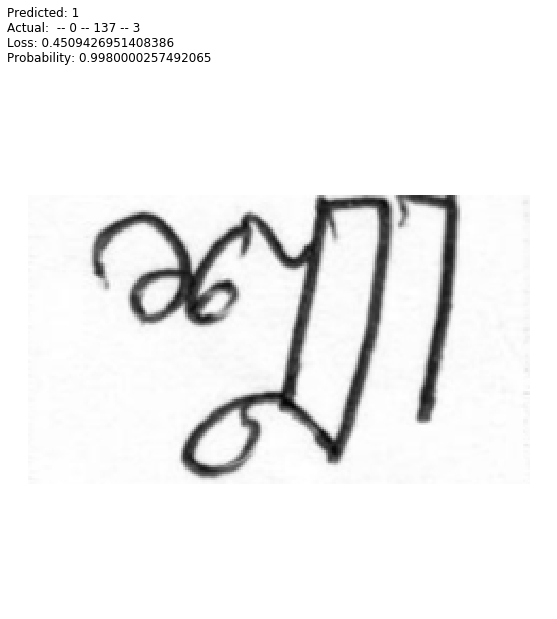

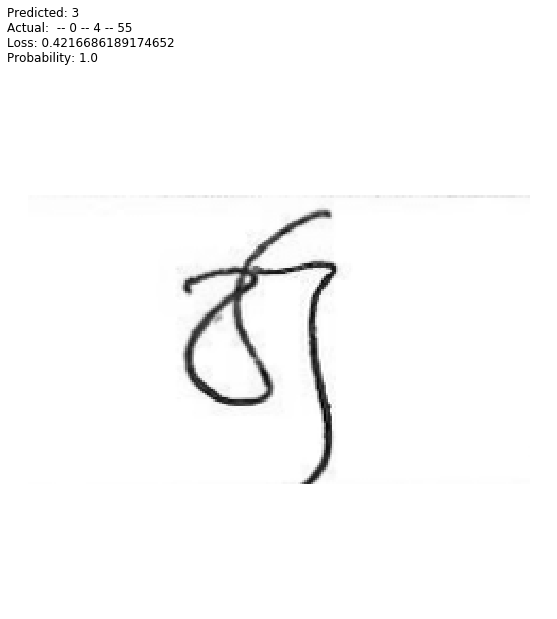

In [0]:
interp=ClassificationInterpretation.from_learner(learner32)

59 misclassified samples over 20084 samples in the validation set.


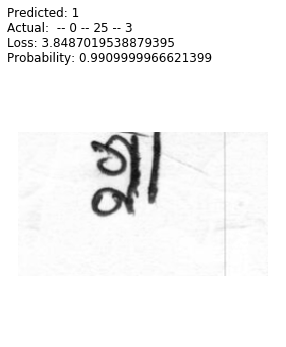

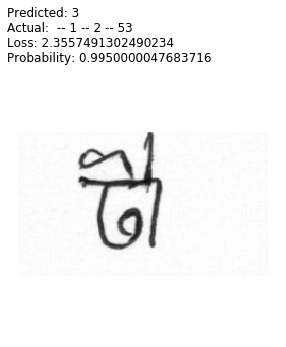

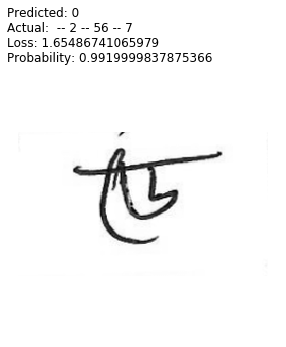

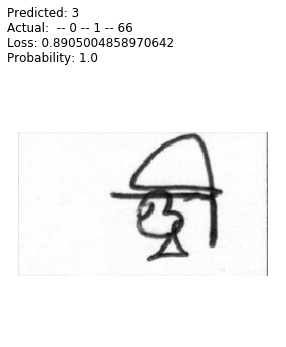

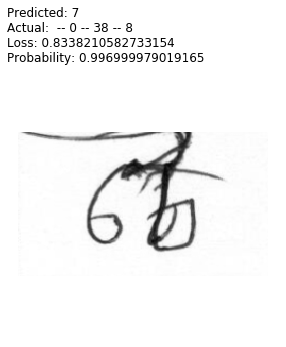

...

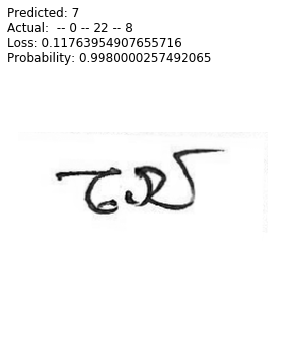

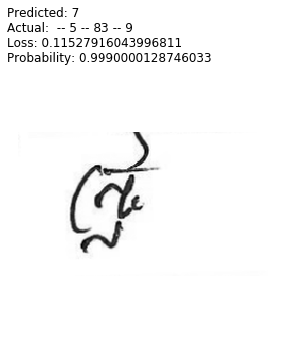

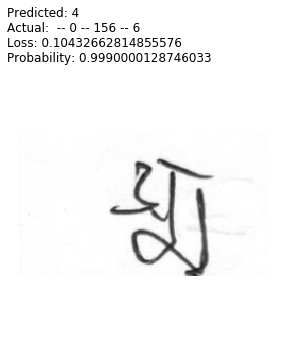

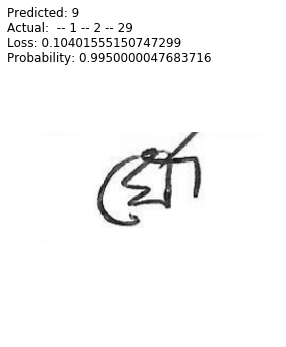

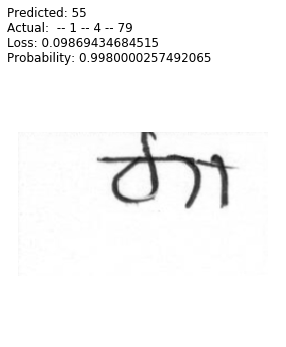

In [0]:
interp.plot_multi_top_losses(20,figsize=(5,5))